In [3]:
import os
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.patches as mpatches

import warnings
warnings.filterwarnings("ignore")

from scipy import stats
from scipy.stats import pearsonr

import ptitprince as pt

In [4]:
path = 'dataset.parquet'

df = pd.read_parquet(path)
df

,time,sample,anomaly,category,setting,action,active,robot_voltage,robot_current,io_current,...,torque_sensor_a_6,torque_sensor_b_6,motor_iq_6,motor_id_6,power_motor_el_6,power_motor_mech_6,power_load_mech_6,motor_voltage_6,supply_voltage_6,brake_voltage_6
0,0.000000,0,True,0,0,0,0,48.582687,0.322263,0.087890,...,0.069086,-0.066240,0.161936,-0.019600,0.115915,0.0,1.157006e-05,0.729223,47.783798,11.177029
1,0.010047,0,True,0,0,0,0,48.582687,0.527340,0.087890,...,0.055269,-0.063480,0.142992,0.020944,0.134123,0.0,-7.832955e-07,0.630203,47.783798,10.976003
2,0.020135,0,True,0,0,0,0,48.561890,0.380857,0.087890,...,0.060796,-0.080041,0.145380,0.011475,0.115405,0.0,4.344085e-07,0.620702,47.803898,11.217231
3,0.030203,0,True,0,0,0,0,48.582687,0.483395,0.087890,...,0.046979,-0.066240,0.147767,0.002005,0.097916,0.0,2.882664e-06,0.623614,47.783798,11.177029
4,0.040257,0,True,0,0,0,0,48.582687,0.307615,0.087890,...,0.046979,-0.074521,0.147767,0.002005,0.104346,0.0,6.304338e-07,0.499930,47.803898,11.156923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2321685,10.716863,2121,False,12,76,13,1,48.561890,0.688472,0.087890,...,0.055269,-0.063480,0.133460,0.024379,0.103935,0.0,-1.502957e-05,0.595642,47.803898,11.217231
2321686,10.726921,2121,False,12,76,13,1,48.561890,0.644527,0.073242,...,0.041452,-0.044160,0.142870,0.021766,0.078053,0.0,7.213437e-07,0.517480,47.803898,10.976000
2321687,10.737022,2121,False,12,76,13,1,48.541092,0.908197,0.087890,...,0.066323,-0.049680,0.124408,-0.008216,0.080420,0.0,9.829410e-06,0.496470,47.783798,11.197131
2321688,10.747115,2121,False,12,76,13,1,48.582687,0.688472,0.117187,...,0.069086,-0.044160,0.124408,-0.008216,0.092157,0.0,7.721170e-06,0.817346,47.783798,11.116721


In [5]:
# Excluding ['time','sample','category','setting','action','active']
df = df.drop(['sample','category','setting','action','active'], axis=1)

# Converting the column 'anomaly' from boolean to int
df['anomaly'] = df['anomaly'].astype(int)

df

,time,anomaly,robot_voltage,robot_current,io_current,system_current,target_position_1,target_velocity_1,target_acceleration_1,target_torque_1,...,torque_sensor_a_6,torque_sensor_b_6,motor_iq_6,motor_id_6,power_motor_el_6,power_motor_mech_6,power_load_mech_6,motor_voltage_6,supply_voltage_6,brake_voltage_6
0,0.000000,1,48.582687,0.322263,0.087890,0.278318,-0.341433,-0.0,-0.0,0.127406,...,0.069086,-0.066240,0.161936,-0.019600,0.115915,0.0,1.157006e-05,0.729223,47.783798,11.177029
1,0.010047,1,48.582687,0.527340,0.087890,0.410153,-0.341433,-0.0,-0.0,0.314227,...,0.055269,-0.063480,0.142992,0.020944,0.134123,0.0,-7.832955e-07,0.630203,47.783798,10.976003
2,0.020135,1,48.561890,0.380857,0.087890,0.292967,-0.341433,-0.0,-0.0,0.002657,...,0.060796,-0.080041,0.145380,0.011475,0.115405,0.0,4.344085e-07,0.620702,47.803898,11.217231
3,0.030203,1,48.582687,0.483395,0.087890,0.263670,-0.341433,-0.0,-0.0,-0.128248,...,0.046979,-0.066240,0.147767,0.002005,0.097916,0.0,2.882664e-06,0.623614,47.783798,11.177029
4,0.040257,1,48.582687,0.307615,0.087890,0.263670,-0.341433,-0.0,-0.0,0.097738,...,0.046979,-0.074521,0.147767,0.002005,0.104346,0.0,6.304338e-07,0.499930,47.803898,11.156923
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2321685,10.716863,0,48.561890,0.688472,0.087890,0.263670,-0.341433,-0.0,-0.0,-1.652499,...,0.055269,-0.063480,0.133460,0.024379,0.103935,0.0,-1.502957e-05,0.595642,47.803898,11.217231
2321686,10.726921,0,48.561890,0.644527,0.073242,0.219725,-0.341433,-0.0,-0.0,-1.703043,...,0.041452,-0.044160,0.142870,0.021766,0.078053,0.0,7.213437e-07,0.517480,47.803898,10.976000
2321687,10.737022,0,48.541092,0.908197,0.087890,0.263670,-0.341433,-0.0,-0.0,-1.405120,...,0.066323,-0.049680,0.124408,-0.008216,0.080420,0.0,9.829410e-06,0.496470,47.783798,11.197131
2321688,10.747115,0,48.582687,0.688472,0.117187,0.278318,-0.341433,-0.0,-0.0,-1.668486,...,0.069086,-0.044160,0.124408,-0.008216,0.092157,0.0,7.721170e-06,0.817346,47.783798,11.116721


## Box Plot

In [7]:
def box_and_whisker(data, title, ylabel, xticklabels, save=True):
    """
    Create a box-and-whisker plot with significance bars.
    """
    
    sns.set(font="Arial", style="ticks")
    sns.set_context("paper", font_scale=1.3)

    ax = plt.axes()
    bp = ax.boxplot(data, widths=0.6, patch_artist=True, showfliers=False)
    ax.set_title(title, fontsize=14)
    ax.set_ylabel(ylabel)
    ax.set_xticklabels(xticklabels)
    ax.tick_params(axis='x', which='minor', length=3, width=1)

    colors = sns.color_palette("hls", 8)
    red = colors[0]
    purple = colors[-2]
    green = colors[3]
    colors_list = [red, green, purple]

    for patch, color in zip(bp['boxes'], colors_list):
        patch.set_facecolor(color)

    plt.setp(bp['medians'], color='k')

    significant_combinations = []
    p_values = []
    ls = list(range(1, len(data) + 1))
    combinations = [(ls[x], ls[x + y]) for y in reversed(ls) for x in range((len(ls) - y))]
    for c in combinations:
        data1 = data[c[0] - 1]
        data2 = data[c[1] - 1]
        U, p = stats.ttest_ind(data1, data2)
        p_values.append(p)
        if p < 0.05:
            significant_combinations.append([c, p])

    bottom, top = ax.get_ylim()
    yrange = top - bottom

    for i, significant_combination in enumerate(significant_combinations):
        x1 = significant_combination[0][0]
        x2 = significant_combination[0][1]
        level = len(significant_combinations) - i
        bar_height = (yrange * 0.08 * level) + top
        bar_tips = bar_height - (yrange * 0.02)
        plt.plot([x1, x1, x2, x2], [bar_tips, bar_height, bar_height, bar_tips], lw=1, c='k')
        p = significant_combination[1]
        if p < 0.001:
            sig_symbol = '***'
        elif p < 0.01:
            sig_symbol = '**'
        elif p < 0.05:
            sig_symbol = '*'
        text_height = bar_height + (yrange * 0.01)
        plt.text((x1 + x2) * 0.5, text_height, sig_symbol, ha='center', c='k')

    bottom, top = ax.get_ylim()
    top = top + (yrange * 0.05)
    yrange = top - bottom
    ax.set_ylim(bottom - 0.02 * yrange, top)
    plt.grid(axis='y')

    if save:
        if not os.path.exists('figures/boxplot'):
            os.makedirs('figures/boxplot')
        plt.savefig('figures/boxplot/' + title + '.png', dpi=1200)

    plt.show()
    return p_values

def plot_boxplot(df, column, title, ylabel, xticklabels, save=True):
    array = []
    
    for i in [1, 0]:
        array.append(df[df.anomaly == i][column].values)
    
    pvalues = box_and_whisker(array, title, ylabel, xticklabels, save=save)

    return pvalues

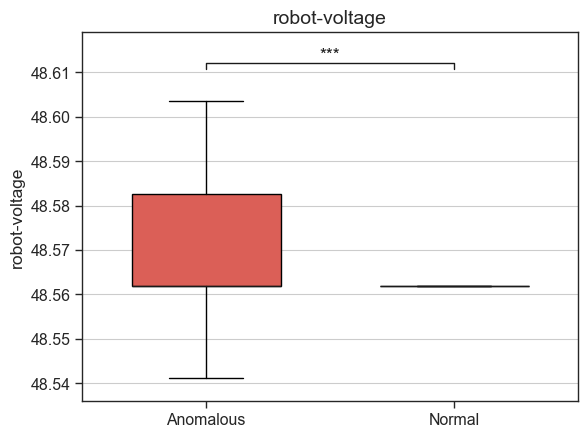

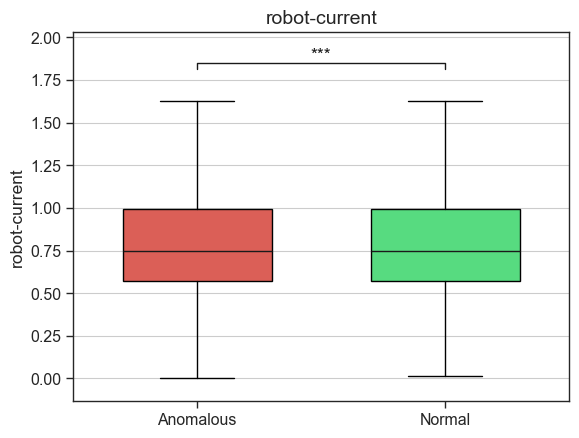

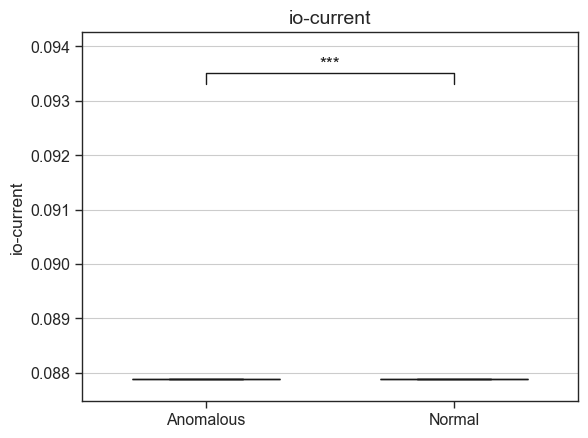

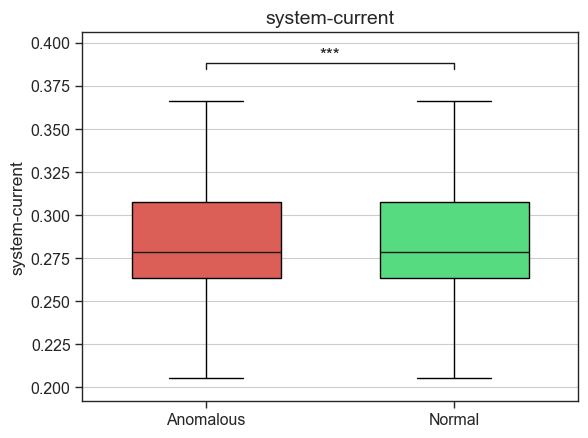

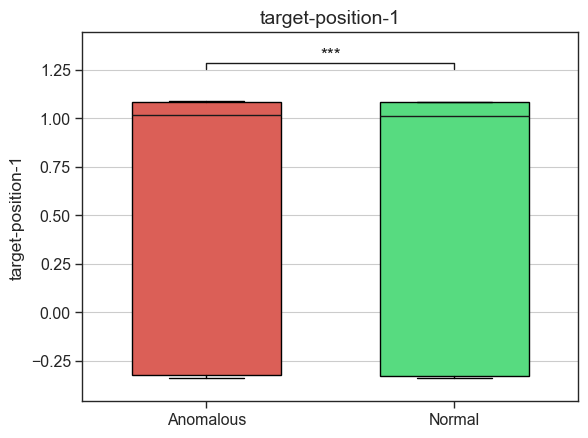

...

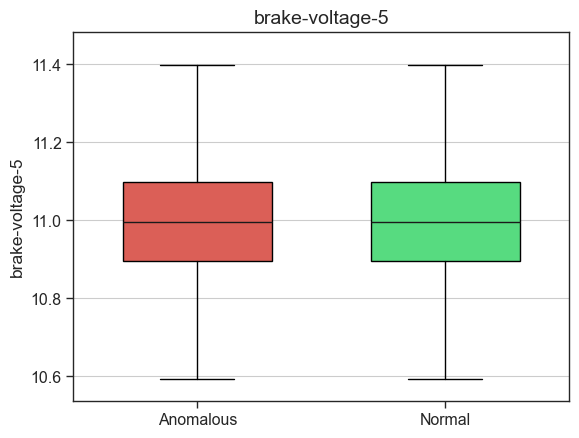

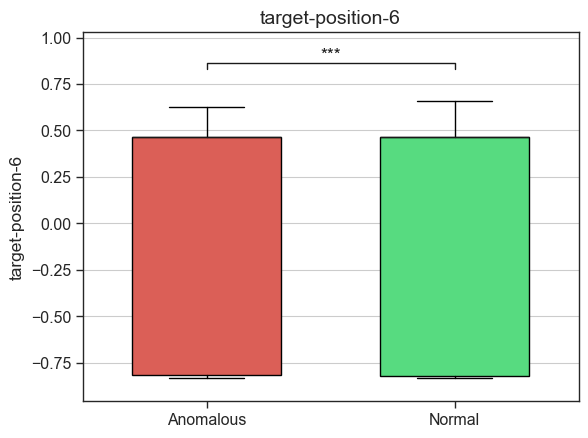

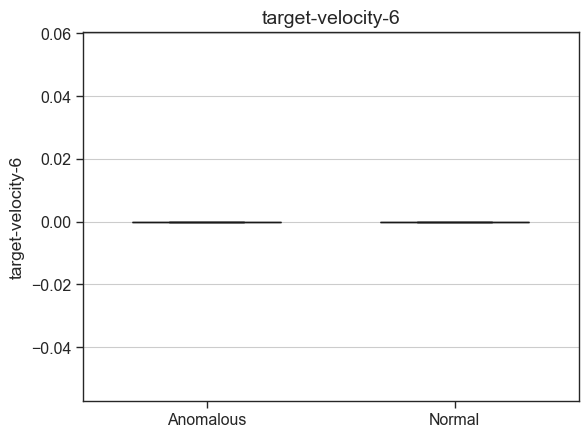

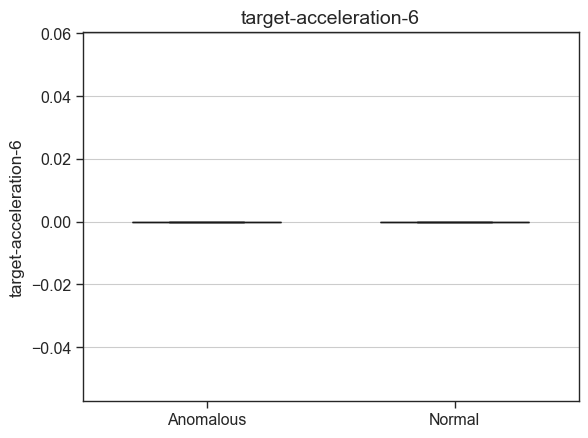

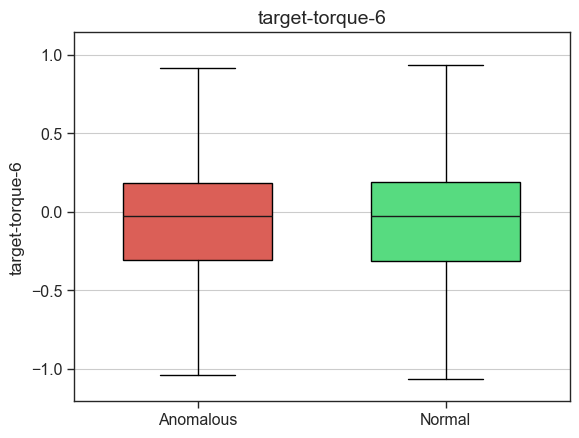

/Users/khoimai/Documents/repo/collection/StatisticalLearning/.venv/lib/python3.12/site-packages/scipy/stats/_axis_nan_policy.py:531: RuntimeWarning: Precision loss occurred in moment calculation due to catastrophic cancellation. This occurs when the data are nearly identical. Results may be unreliable.
  res = hypotest_fun_out(*samples, **kwds)


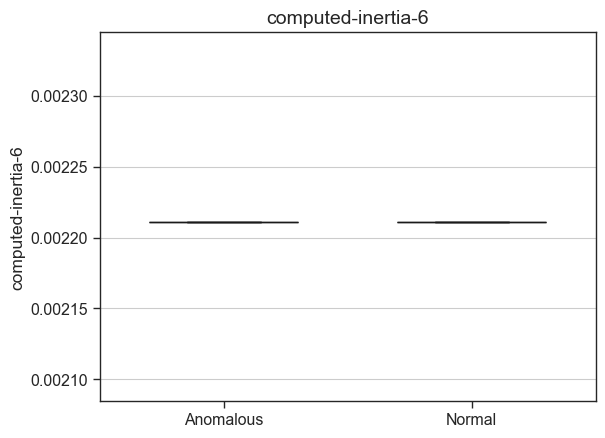

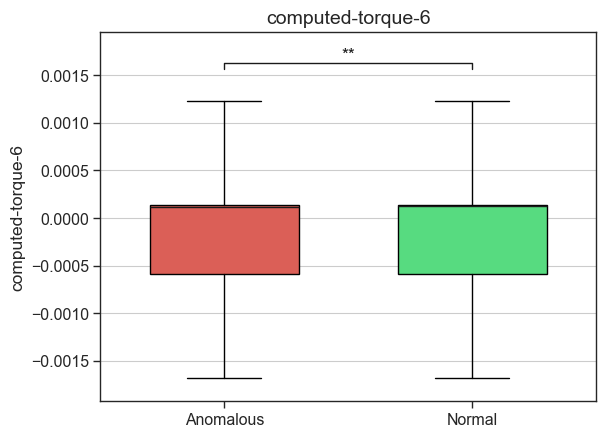

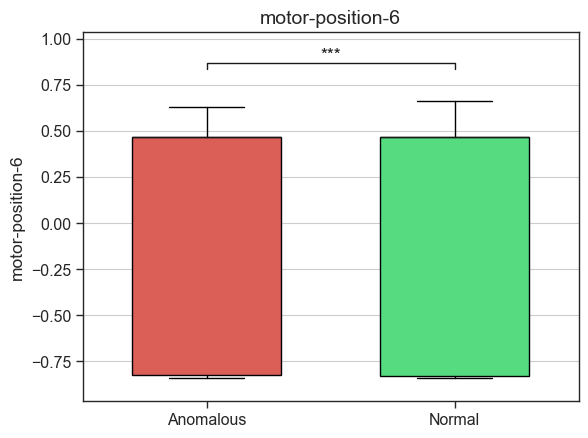

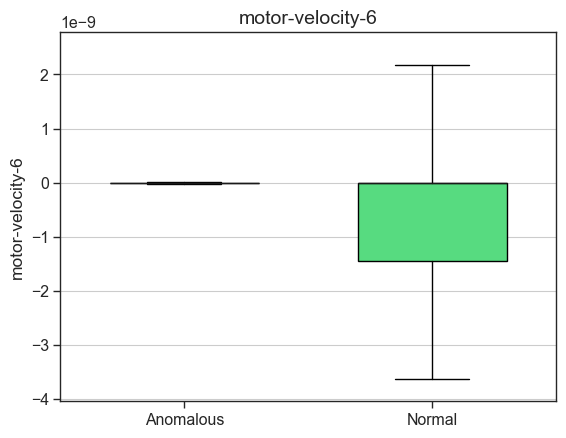

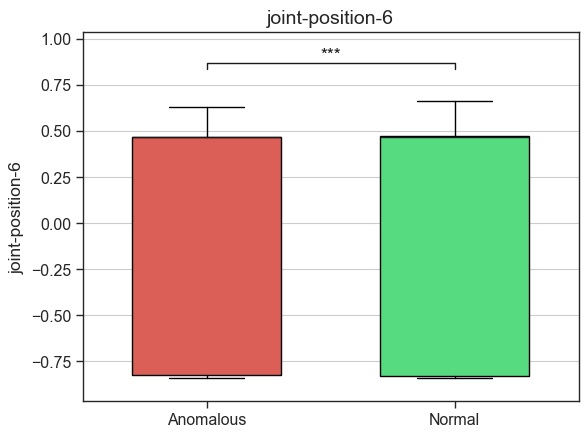

...

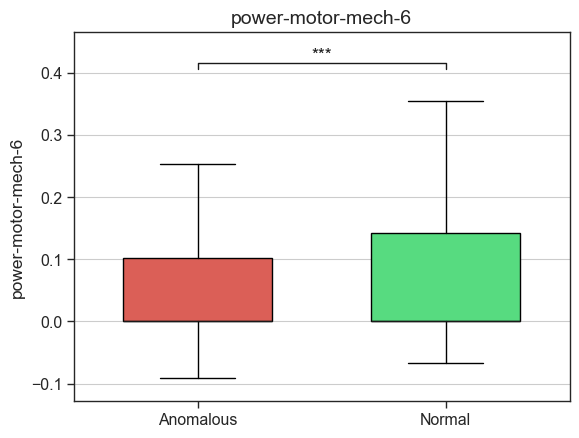

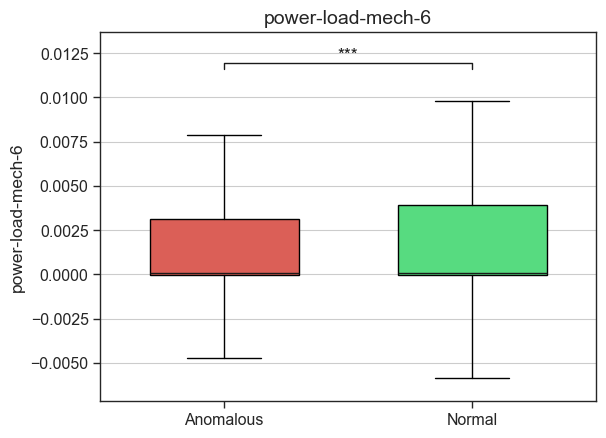

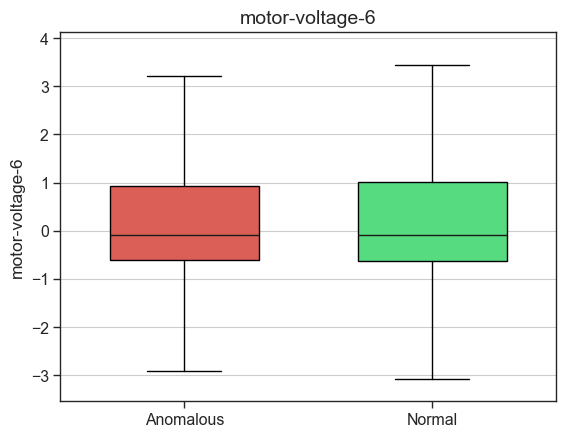

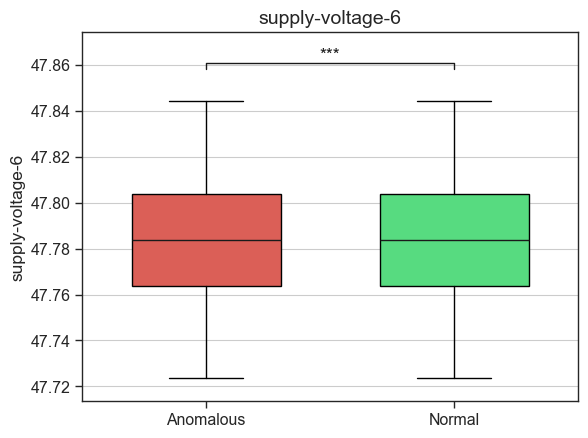

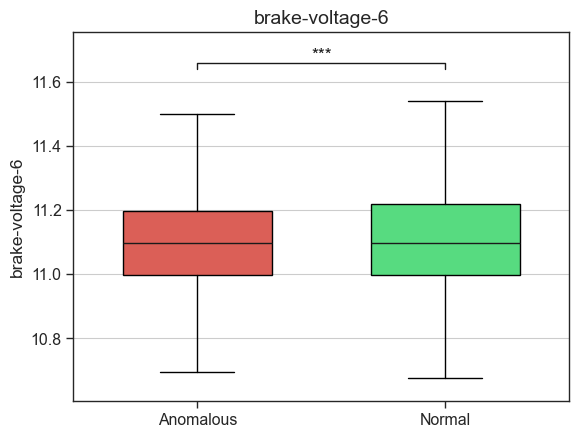

In [12]:
# Get the list of all columns in the dataset except 'anomaly'
columns = df.columns.tolist()
columns.remove('anomaly')
columns.remove('time')

# Create a boxplot for each column in the dataset
p_values = {}
for column in columns:
    ft = column.replace('_', '-')
    xticklabels = ['Anomalous', 'Normal']
    p_values[column] = plot_boxplot(df, column, ft, ft, xticklabels, save=True)

In [14]:
p_values

{'robot_voltage': [0.0],
 'robot_current': [9.078282936967046e-48],
 'io_current': [0.0],
 'system_current': [2.308605100078454e-31],
 'target_position_1': [7.562472512612289e-15],
 'target_velocity_1': [0.9999996878478637],
 'target_acceleration_1': [0.999999993074097],
 'target_torque_1': [0.9235643542315826],
 'computed_inertia_1': [3.9554310534028466e-32],
 'computed_torque_1': [0.9827021050409268],
 'motor_position_1': [2.5208747573515606e-14],
 'motor_velocity_1': [0.9931068680938333],
 'joint_position_1': [8.705588073674706e-15],
 'joint_velocity_1': [0.991170492804978],
 'motor_torque_1': [3.614456012310621e-06],
 'torque_sensor_a_1': [7.218946393788708e-07],
 'torque_sensor_b_1': [6.74160323994341e-12],
 'motor_iq_1': [0.0082941599039049],
 'motor_id_1': [0.02094463570723115],
 'power_motor_el_1': [2.3323548317632913e-88],
 'power_motor_mech_1': [1.0030518081698306e-76],
 'power_load_mech_1': [0.02256935084275961],
 'motor_voltage_1': [0.15211767191612952],
 'supply_voltage_1'

In [18]:
# convert the p-values to a DataFrame

p_values_df = pd.DataFrame(p_values, index=['p-value']).T
p_values_df

# save the p-values to a CSV file
p_values_df.to_csv('data_binary_anomaly_vs_normal/p_values.csv')

## Correlation

In [9]:
p_values_df = pd.read_csv('data_binary_anomaly_vs_normal/p_values.csv',index_col=0)
p_values_df

,p-value
robot_voltage,0.000000e+00
robot_current,9.078283e-48
io_current,0.000000e+00
system_current,2.308605e-31
target_position_1,7.562473e-15
...,...
power_motor_mech_6,7.918110e-06
power_load_mech_6,1.271167e-101
motor_voltage_6,6.739856e-01
supply_voltage_6,2.910698e-04


In [15]:
# Filter features with p-value less than 0.001 (***)
selected_fts_significant = p_values_df[p_values_df['p-value'] < 0.001]
print('Number of significant features:', selected_fts_significant.size)

# Sort by p-value
selected_fts_significant = selected_fts_significant.sort_values(by='p-value')

# Get top 20 features
selected_fts_significant = selected_fts_significant.head(20)
top_20_features = selected_fts_significant.index.tolist()

print("Top 20 significant features:", top_20_features)

# selected_fts_significant_columns = selected_fts_significant.index.tolist()
# print('Number of significant features:', len(selected_fts_significant_columns))

Number of significant features: 72
Top 20 significant features: ['robot_voltage', 'supply_voltage_2', 'torque_sensor_a_3', 'torque_sensor_b_6', 'torque_sensor_b_3', 'supply_voltage_5', 'io_current', 'torque_sensor_a_4', 'supply_voltage_3', 'torque_sensor_a_6', 'torque_sensor_b_4', 'brake_voltage_2', 'brake_voltage_3', 'power_load_mech_6', 'power_motor_el_1', 'supply_voltage_1', 'torque_sensor_b_5', 'torque_sensor_b_2', 'power_motor_mech_1', 'motor_iq_2']


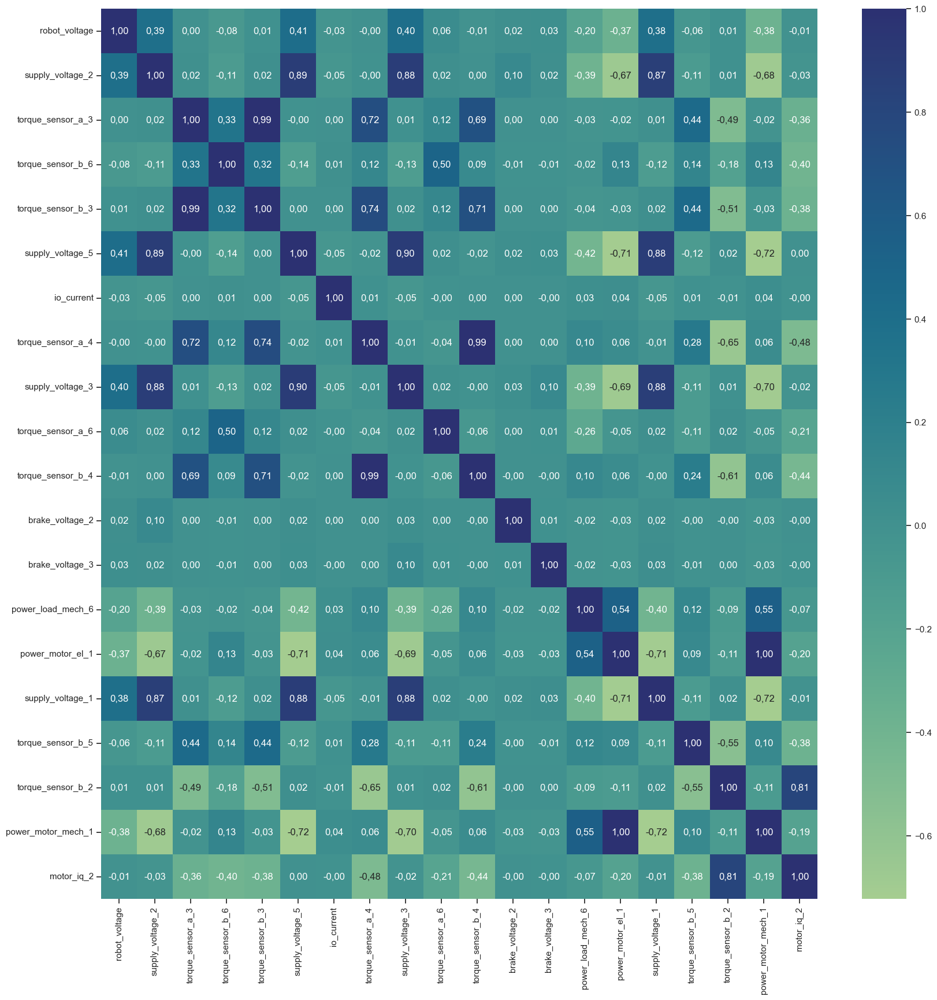

In [16]:
df_corr = df[top_20_features].corr()

# Save matrix of p-values
df_p = pd.DataFrame()  
for x in df_corr.columns:
    for y in df_corr.columns:
        corr = stats.pearsonr(df[x], df[y])
        df_corr.loc[x,y] = corr[0]
        df_p.loc[x,y] = corr[1]

corr_formatted = df_corr.applymap(lambda x: f"{x:.2f}".replace('.', ','))

sns.set(style="ticks")
plt.figure(figsize=(20, 20))
sns.heatmap(df_corr, cmap="crest", annot=corr_formatted, fmt="")

# save png
if os.path.exists('figures/corr'):
    pass
else:
    os.makedirs('figures/corr')
    
plt.yticks(va='center')

plt.savefig('figures/corr/corr_heatmap.png', dpi=1200)
plt.show()

In [17]:
# save pvalues matrix
df_p.to_csv("figures/corr/corr_pvalue.csv")

In [18]:
# save correlation matrix
df_corr.to_csv("figures/corr/corr_value.csv")

# RainCloud

In [8]:
def raincloud_plot(ft_column, target_column, data):
    dx = target_column
    dy = ft_column
    ort = "v"
    title = ft_column.replace('_', '-')
    df = data.copy()[[ft_column] + [target_column]]

    df[target_column] = df[target_column].apply(lambda x: 'Anomalous' if x == 1 else 'Normal')
    category_order = ["Anomalous", "Normal"]

    colors = sns.color_palette("hls", 8)
    red = colors[0]
    purple = colors[-2]
    green = colors[3]
    colors_list = [red, green]

    f, ax = plt.subplots()
    sns.set(font="Arial", style="ticks")
    sns.set_context("paper", font_scale=1.5)
    ax=pt.half_violinplot(x = dx, y = dy, data = df, palette = colors_list, bw = .2, cut = 0.,
                        scale = "area", width = .6, inner = None, orient = ort, order = category_order)
    ax=sns.stripplot(x = dx, y = dy, data = df, palette = colors_list, edgecolor = "white",
                    size = 3, jitter = 1, zorder = 0, orient = ort, order = category_order)
    ax=sns.boxplot(x = dx, y = dy, data = df, color = "black", width = .15, zorder = 10,\
                showcaps = True, boxprops = {'facecolor':'none', "zorder":10},\
                showfliers=True, whiskerprops = {'linewidth':2, "zorder":10},\
                saturation = 1, orient = ort, order = category_order)

    plt.title(title)
    plt.xlabel("")
    plt.ylabel(title)

    # save png
    if os.path.exists("figures/raincloud/"):
        pass
    else:
        os.makedirs("figures/raincloud/")

    plt.savefig(f'figures/raincloud/{title}.png', dpi=1200)

    plt.show()

### All Predictors

In [9]:
all_ft_column = [
    'robot_voltage',
    'robot_current',
    'io_current',
    'system_current',
    'target_position_1',
    'target_velocity_1',
    'target_acceleration_1',
    'target_torque_1',
    'computed_inertia_1',
    'computed_torque_1',
    'motor_position_1',
    'motor_velocity_1',
    'joint_position_1',
    'joint_velocity_1',
    'motor_torque_1',
    'torque_sensor_a_1',
    'torque_sensor_b_1',
    'motor_iq_1',
    'motor_id_1',
    'power_motor_el_1',
    'power_motor_mech_1',
    'power_load_mech_1',
    'motor_voltage_1',
    'supply_voltage_1',
    'brake_voltage_1',
    'target_position_2',
    'target_velocity_2',
    'target_acceleration_2',
    'target_torque_2',
    'computed_inertia_2',
    'computed_torque_2',
    'motor_position_2',
    'motor_velocity_2',
    'joint_position_2',
    'joint_velocity_2',
    'motor_torque_2',
    'torque_sensor_a_2',
    'torque_sensor_b_2',
    'motor_iq_2',
    'motor_id_2',
    'power_motor_el_2',
    'power_motor_mech_2',
    'power_load_mech_2',
    'motor_voltage_2',
    'supply_voltage_2',
    'brake_voltage_2',
    'target_position_3',
    'target_velocity_3',
    'target_acceleration_3',
    'target_torque_3',
    'computed_inertia_3',
    'computed_torque_3',
    'motor_position_3',
    'motor_velocity_3',
    'joint_position_3',
    'joint_velocity_3',
    'motor_torque_3',
    'torque_sensor_a_3',
    'torque_sensor_b_3',
    'motor_iq_3',
    'motor_id_3',
    'power_motor_el_3',
    'power_motor_mech_3',
    'power_load_mech_3',
    'motor_voltage_3',
    'supply_voltage_3',
    'brake_voltage_3',
    'target_position_4',
    'target_velocity_4',
    'target_acceleration_4',
    'target_torque_4',
    'computed_inertia_4',
    'computed_torque_4',
    'motor_position_4',
    'motor_velocity_4',
    'joint_position_4',
    'joint_velocity_4',
    'motor_torque_4',
    'torque_sensor_a_4',
    'torque_sensor_b_4',
    'motor_iq_4',
    'motor_id_4',
    'power_motor_el_4',
    'power_motor_mech_4',
    'power_load_mech_4',
    'motor_voltage_4',
    'supply_voltage_4',
    'brake_voltage_4',
    'target_position_5',
    'target_velocity_5',
    'target_acceleration_5',
    'target_torque_5',
    'computed_inertia_5',
    'computed_torque_5',
    'motor_position_5',
    'motor_velocity_5',
    'joint_position_5',
    'joint_velocity_5',
    'motor_torque_5',
    'torque_sensor_a_5',
    'torque_sensor_b_5',
    'motor_iq_5',
    'motor_id_5',
    'power_motor_el_5',
    'power_motor_mech_5',
    'power_load_mech_5',
    'motor_voltage_5',
    'supply_voltage_5',
    'brake_voltage_5',
    'target_position_6',
    'target_velocity_6',
    'target_acceleration_6',
    'target_torque_6',
    'computed_inertia_6',
    'computed_torque_6',
    'motor_position_6',
    'motor_velocity_6',
    'joint_position_6',
    'joint_velocity_6',
    'motor_torque_6',
    'torque_sensor_a_6',
    'torque_sensor_b_6',
    'motor_iq_6',
    'motor_id_6',
    'power_motor_el_6',
    'power_motor_mech_6',
    'power_load_mech_6',
    'motor_voltage_6',
    'supply_voltage_6',
    'brake_voltage_6']

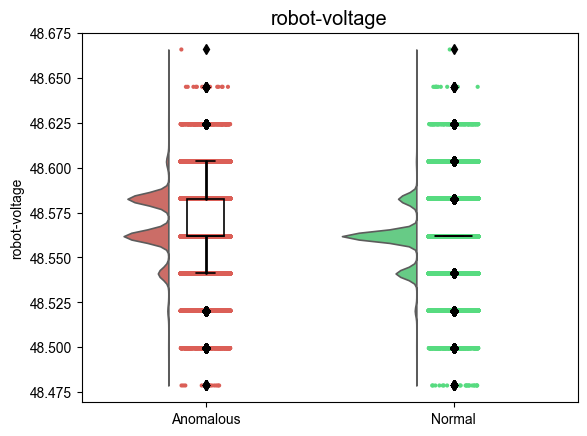

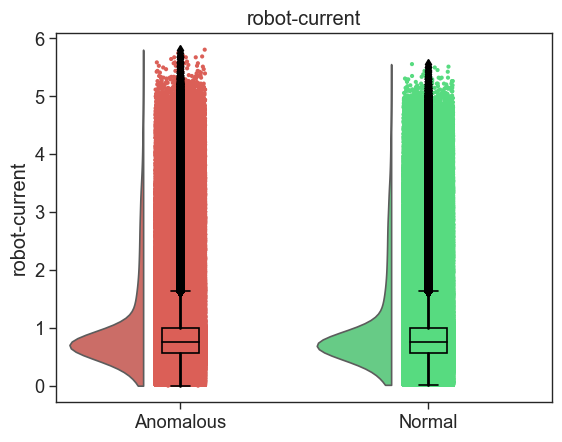

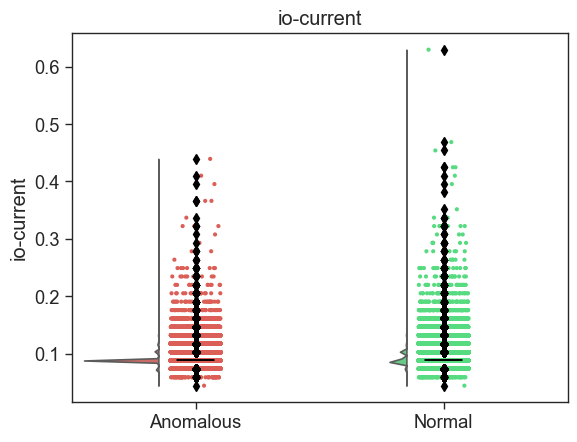

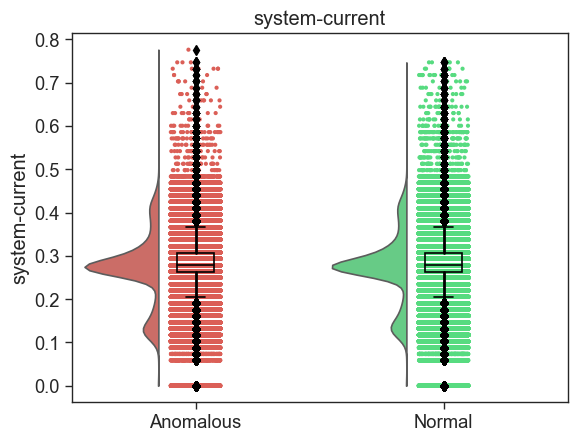

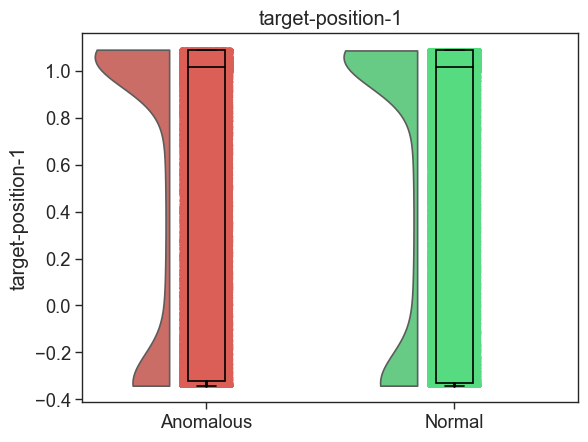

...

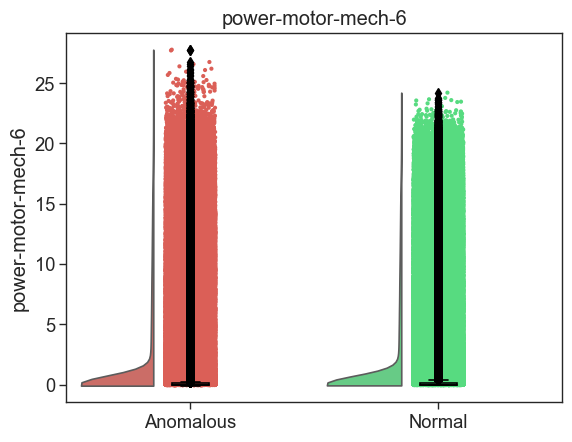

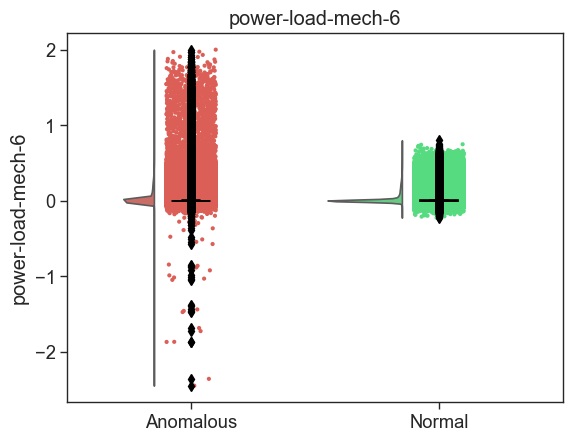

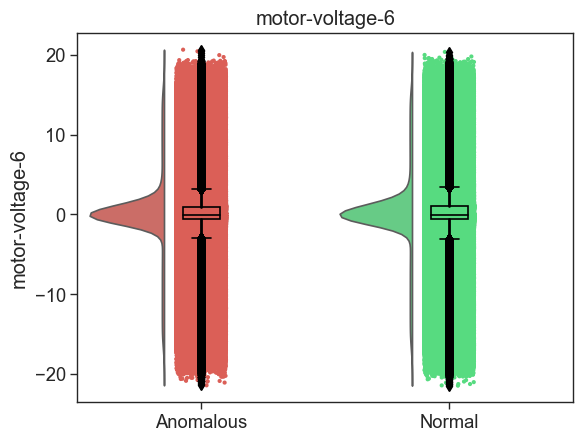

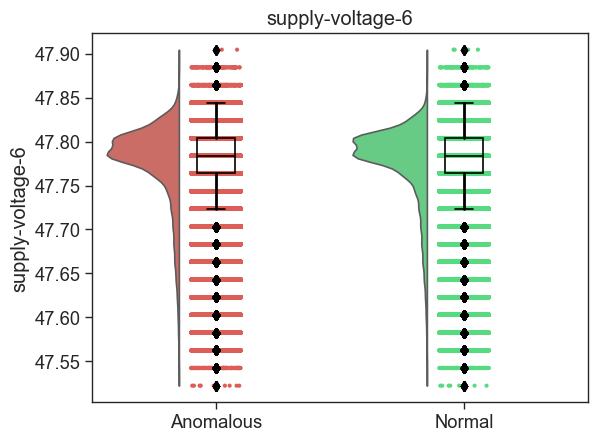

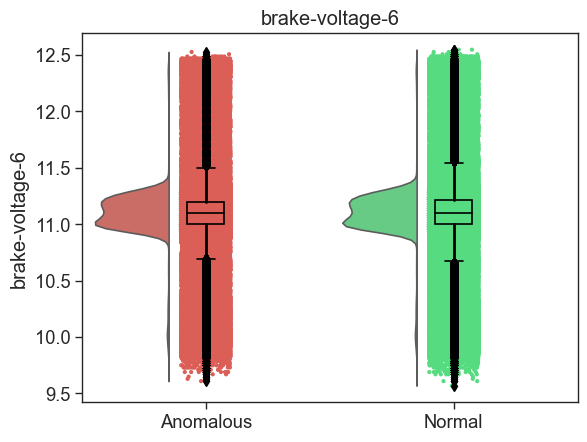

In [10]:
for col in all_ft_column:
    raincloud_plot(col, 'anomaly', df)

# Clustermap

In [30]:
def extract_clustered_table(res, data):
    """
    input
    =====
    res:     <sns.matrix.ClusterGrid>  the clustermap object
    data:    <pd.DataFrame>            input table
    
    output
    ======
    returns: <pd.DataFrame>            reordered input table
    """
    
    # if sns.clustermap is run with row_cluster=False:
    if res.dendrogram_row is None:
        print("Apparently, rows were not clustered.")
        return -1
    
    if res.dendrogram_col is not None:
        # reordering index and columns
        new_cols = data.columns[res.dendrogram_col.reordered_ind]
        new_ind = data.index[res.dendrogram_row.reordered_ind]
        
        return data.loc[new_ind, new_cols]
    
    else:
        # reordering the index
        new_ind = data.index[res.dendrogram_row.reordered_ind]

        return data.loc[new_ind,:]

## Top 20 Predictors

In [12]:
top_20_features = ['robot_voltage', 'supply_voltage_2', 'torque_sensor_a_3', 'torque_sensor_b_6', 'torque_sensor_b_3', 'supply_voltage_5', 'io_current', 'torque_sensor_a_4', 'supply_voltage_3', 'torque_sensor_a_6',
                   'torque_sensor_b_4', 'brake_voltage_2', 'brake_voltage_3', 'power_load_mech_6', 'power_motor_el_1', 'supply_voltage_1', 'torque_sensor_b_5', 'torque_sensor_b_2', 'power_motor_mech_1', 'motor_iq_2',
                   'anomaly']

data_20_predictors = df[top_20_features]
data_20_predictors

,robot_voltage,supply_voltage_2,torque_sensor_a_3,torque_sensor_b_6,torque_sensor_b_3,supply_voltage_5,io_current,torque_sensor_a_4,supply_voltage_3,torque_sensor_a_6,...,brake_voltage_2,brake_voltage_3,power_load_mech_6,power_motor_el_1,supply_voltage_1,torque_sensor_b_5,torque_sensor_b_2,power_motor_mech_1,motor_iq_2,anomaly
0,48.582687,47.482258,-32.643375,-0.066240,-31.770451,47.622978,0.087890,-4.513991,47.864208,0.069086,...,10.734771,11.056413,1.157006e-05,0.754705,47.663181,0.058321,29.329155,0.000000e+00,2.046316,1
1,48.582687,47.462154,-32.654327,-0.063480,-31.595356,47.622978,0.087890,-4.522561,47.864208,0.055269,...,10.754872,11.156926,-7.832955e-07,0.725759,47.663181,0.037849,29.318150,8.927782e-11,2.039519,1
2,48.561890,47.442055,-32.654327,-0.080041,-31.584412,47.622978,0.087890,-4.528273,47.864208,0.060796,...,10.694568,10.835285,4.344085e-07,0.724332,47.663181,0.049547,29.384178,2.369646e-20,2.027373,1
3,48.582687,47.482258,-32.665279,-0.066240,-31.595356,47.622978,0.087890,-4.516848,47.844105,0.046979,...,11.016207,10.915694,2.882664e-06,0.736677,47.683285,0.067095,29.274136,5.954862e-30,2.055787,1
4,48.582687,47.482258,-32.676228,-0.074521,-31.661018,47.643078,0.087890,-4.516848,47.864208,0.046979,...,10.734771,11.016208,6.304338e-07,0.733309,47.683285,0.029075,29.362167,1.605462e-39,2.074729,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2321685,48.561890,47.442055,-23.345894,-0.063480,-22.588913,47.643078,0.087890,-2.743071,47.844105,0.055269,...,10.754875,11.036309,-1.502957e-05,0.546533,47.663181,-0.038191,16.036118,1.430861e-09,1.753105,0
2321686,48.561890,47.462154,-23.630623,-0.044160,-22.643631,47.622978,0.073242,-3.228646,47.844105,0.041452,...,10.895590,10.895592,7.213437e-07,0.290468,47.683285,0.119738,15.397877,-6.444656e-04,1.992114,0
2321687,48.541092,47.462154,-24.265787,-0.049680,-23.157972,47.622978,0.087890,-2.851612,47.864208,0.066323,...,10.774975,11.116721,9.829410e-06,0.113139,47.663181,0.096341,16.938459,-4.149056e-08,2.151949,0
2321688,48.582687,47.462154,-25.798941,-0.044160,-24.788544,47.663181,0.117187,-3.471434,47.844105,0.069086,...,9.448206,10.815182,7.721170e-06,0.136562,47.683285,0.113889,18.886198,-1.143842e-17,2.392447,0


In [14]:
# Set a random state
random_state = 42
subset_20_predictors = data_20_predictors.sample(n=5000, random_state=random_state)
subset_20_predictors

,robot_voltage,supply_voltage_2,torque_sensor_a_3,torque_sensor_b_6,torque_sensor_b_3,supply_voltage_5,io_current,torque_sensor_a_4,supply_voltage_3,torque_sensor_a_6,...,brake_voltage_2,brake_voltage_3,power_load_mech_6,power_motor_el_1,supply_voltage_1,torque_sensor_b_5,torque_sensor_b_2,power_motor_mech_1,motor_iq_2,anomaly
1094531,48.541092,47.321438,-42.433655,-0.063480,-40.328213,47.482258,0.117187,-6.002136,47.703388,-0.035923,...,10.734771,11.036311,0.000219,0.365274,47.562668,0.040773,57.125690,4.781678e-04,7.171645,0
1247071,48.561890,47.462154,-35.479710,-0.237364,-35.009705,47.643078,0.087890,-5.225216,47.884308,-0.024869,...,10.654359,11.116718,0.000133,1.428548,47.663181,-0.626036,49.499802,6.752038e-02,5.329353,0
463012,48.582687,47.442055,-28.076769,-0.080041,-27.918365,47.602875,0.087890,-3.928445,47.824001,0.088430,...,10.694568,10.855386,-0.000018,0.423555,47.663181,0.181154,22.209457,-1.413040e-10,3.124203,1
366320,48.561890,47.442055,-35.348297,-0.226324,-34.801781,47.643078,0.087890,-5.305193,47.864208,-0.013816,...,10.935798,10.976003,-0.000067,1.041556,47.643078,-0.626036,49.444778,6.619064e-26,5.384202,1
609992,48.582687,47.442055,-20.816191,-0.046920,-21.428909,47.643078,0.102538,-3.411451,47.864208,0.071850,...,10.875490,10.996105,0.000035,1.072137,47.683285,-0.272159,33.664799,2.020530e-03,3.942641,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
32434,48.603485,47.462154,-35.468758,-0.204244,-34.801781,47.643078,0.087890,-5.242354,47.864208,0.019345,...,10.935795,10.935798,-0.000020,0.719959,47.683285,-0.628960,49.290722,1.851173e-02,5.322683,1
1409862,48.541092,47.361645,-30.792641,-0.049680,-28.990822,47.542564,0.117187,-5.702222,47.783798,0.063559,...,9.669337,11.016209,-0.000026,0.420885,47.602875,-0.017719,47.662102,2.936565e-04,6.257705,0
1907518,48.582687,47.462154,-21.834644,-0.077281,-20.411171,47.643078,0.087890,-3.348612,47.844105,-0.066320,...,10.674461,10.895592,0.000371,1.436869,47.683285,0.128511,31.750072,1.290003e-03,1.372521,0
568162,48.541092,47.321438,-30.847397,0.171125,-30.096107,47.462154,0.087890,-4.556836,47.683285,0.082903,...,10.915694,10.915695,0.178784,100.955002,47.542564,0.467765,39.441990,9.953618e+01,2.548507,1


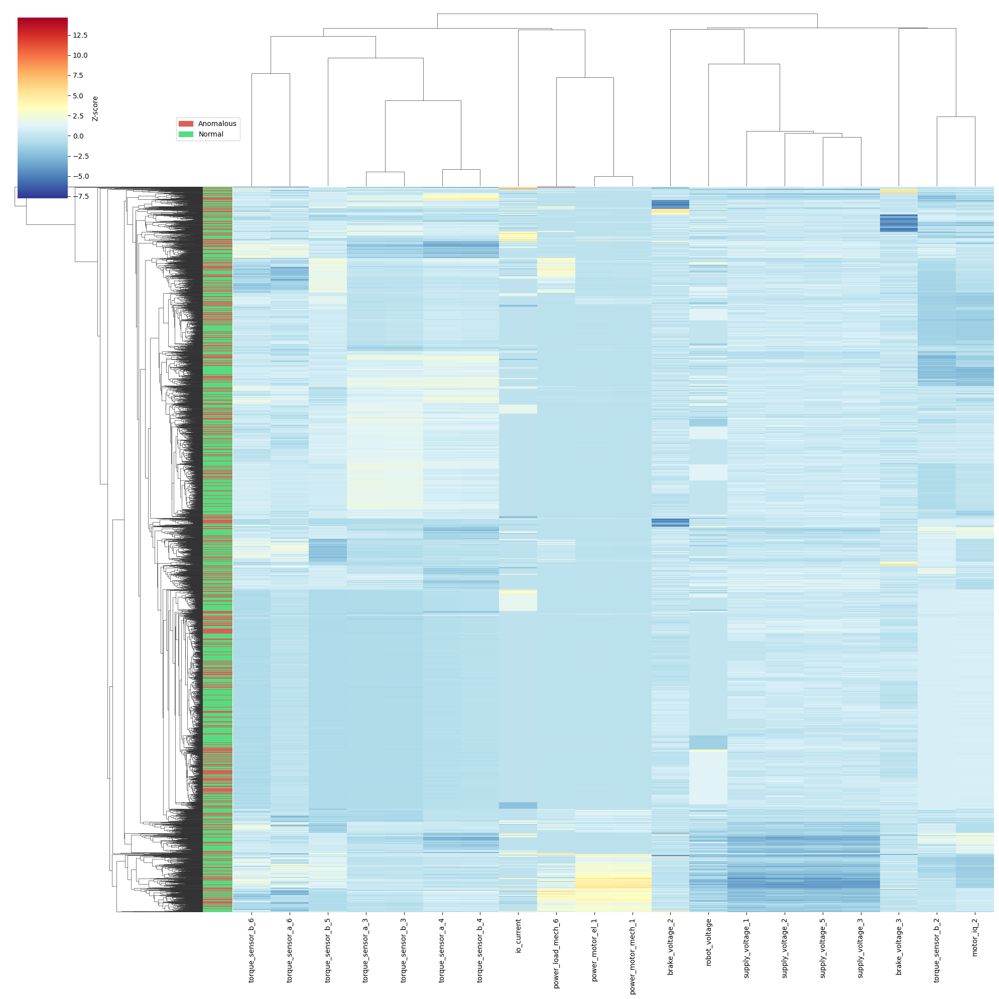

In [31]:
# Create a color dictionary for your categories
colors = sns.color_palette("hls", 8)
red = colors[0]
green = colors[3]
color_dict = {1: red, 0: green}


# Create a list of colors for each row
row_colors = subset_20_predictors['anomaly'].map(color_dict).values

# plot the re-ordered cluster map
cbar_kws={'orientation': 'vertical',
        'label': 'Z-score',
        'extendrect':True,
        'shrink': .5,
        }

# Create the clustermap
cluster_top_20 = sns.clustermap(subset_20_predictors.drop('anomaly', axis=1),
                       row_colors=row_colors,
                       z_score=1,
                       cmap='RdYlBu_r',
                       col_cluster=True,
                       yticklabels=False,
                       cbar_kws=cbar_kws,
                      #  method='centroid',
                       figsize=(20,20),
                       )

plt.setp(cluster_top_20.ax_heatmap.get_xticklabels(), 
        rotation=90
        )

legend_labels = [mpatches.Patch(color=red, label='Anomalous'),
                mpatches.Patch(color=green, label='Normal')]
    
plt.legend(handles=legend_labels, 
           title='', 
           loc='lower right', 
           bbox_to_anchor=(4.5, 0.3),
           **{'ncol': 1})

# cb_ax = cluster.ax_cbar.yaxis.set_label_position('left')
plt.xlabel('Target', visible=False)

# Show the plot
if os.path.exists('figures/clustermap/'):
    pass
else:
    os.makedirs('figures/clustermap/')

plt.savefig('figures/clustermap/clustermap_20_predictors.png', dpi=1200, bbox_inches='tight')

plt.show()

In [33]:
# print(cluster_top_20.dendrogram_row.reordered_ind)
print(cluster_top_20.dendrogram_col.reordered_ind)

[3, 9, 16, 2, 4, 7, 10, 6, 13, 14, 18, 11, 0, 15, 1, 5, 8, 12, 17, 19]


In [43]:
cluster_table_20_predictors = extract_clustered_table(cluster_top_20, subset_20_predictors)
cluster_table_20_predictors

,torque_sensor_b_6,torque_sensor_a_6,torque_sensor_b_5,torque_sensor_a_3,torque_sensor_b_3,torque_sensor_a_4,torque_sensor_b_4,io_current,power_load_mech_6,power_motor_el_1,power_motor_mech_1,brake_voltage_2,robot_voltage,supply_voltage_1,supply_voltage_2,supply_voltage_5,supply_voltage_3,brake_voltage_3,torque_sensor_b_2,motor_iq_2
139513,0.596175,0.735066,-0.985762,-32.446255,-31.157619,-4.768204,-5.142670,0.08789,1.168115,9.928902,12.989479,10.895591,48.582687,47.622978,47.401848,47.562668,47.803898,10.875487,48.179298,3.327138
141369,-0.778337,-0.710193,0.777773,-30.518864,-30.840260,-4.468290,-4.482500,0.08789,1.004877,1.339576,-0.117496,10.754873,48.582687,47.663181,47.482258,47.622978,47.864208,11.177029,32.520367,3.808901
135831,-0.772817,-0.605183,0.900606,-34.329845,-33.390079,-4.919590,-5.068365,0.08789,1.159219,-1.469574,1.726160,10.694568,48.603485,47.683285,47.442055,47.643078,47.844105,11.076515,34.005928,3.683303
139944,0.557534,0.831785,0.570126,-42.893600,-42.516899,-7.593108,-7.851937,0.08789,0.071219,1.137186,0.736536,10.714667,48.582687,47.703388,47.462154,47.663181,47.884308,10.875487,55.838203,5.186234
136148,0.678977,0.613476,0.567202,-32.917152,-34.079514,-5.045268,-5.091228,0.08789,0.290227,24.588045,19.115305,10.915693,48.582687,47.683285,47.401848,47.602875,47.824001,11.096617,27.942631,1.915927
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1705140,-0.005519,0.060796,-0.757643,-31.252586,-31.234222,-4.388313,-4.593957,0.08789,0.301818,74.662674,79.150246,11.820310,48.541092,47.582771,47.321438,47.442055,47.763695,10.815182,42.589180,4.670324
2318483,-0.057960,-0.116062,-0.476881,-28.241035,-27.819874,-4.525417,-4.539658,0.08789,0.144718,57.822815,51.473537,12.041439,48.541092,47.582771,47.361645,47.502361,47.763695,11.076515,46.825787,3.279453
1969416,-0.317406,0.005528,-0.488579,-34.406502,-33.959137,-4.648239,-4.782577,0.08789,0.223353,49.907024,45.594921,11.961027,48.561890,47.602875,47.401848,47.582771,47.803898,11.056411,38.011448,3.983926
1948208,-0.077281,0.008291,-1.193408,-30.069866,-29.494217,-5.142383,-5.239838,0.08789,0.140554,11.350296,8.169202,12.121848,48.541092,47.643078,47.421951,47.582771,47.803898,10.815180,49.224697,3.446233


In [44]:
cluster_table_20_predictors

,torque_sensor_b_6,torque_sensor_a_6,torque_sensor_b_5,torque_sensor_a_3,torque_sensor_b_3,torque_sensor_a_4,torque_sensor_b_4,io_current,power_load_mech_6,power_motor_el_1,power_motor_mech_1,brake_voltage_2,robot_voltage,supply_voltage_1,supply_voltage_2,supply_voltage_5,supply_voltage_3,brake_voltage_3,torque_sensor_b_2,motor_iq_2
139513,0.596175,0.735066,-0.985762,-32.446255,-31.157619,-4.768204,-5.142670,0.08789,1.168115,9.928902,12.989479,10.895591,48.582687,47.622978,47.401848,47.562668,47.803898,10.875487,48.179298,3.327138
141369,-0.778337,-0.710193,0.777773,-30.518864,-30.840260,-4.468290,-4.482500,0.08789,1.004877,1.339576,-0.117496,10.754873,48.582687,47.663181,47.482258,47.622978,47.864208,11.177029,32.520367,3.808901
135831,-0.772817,-0.605183,0.900606,-34.329845,-33.390079,-4.919590,-5.068365,0.08789,1.159219,-1.469574,1.726160,10.694568,48.603485,47.683285,47.442055,47.643078,47.844105,11.076515,34.005928,3.683303
139944,0.557534,0.831785,0.570126,-42.893600,-42.516899,-7.593108,-7.851937,0.08789,0.071219,1.137186,0.736536,10.714667,48.582687,47.703388,47.462154,47.663181,47.884308,10.875487,55.838203,5.186234
136148,0.678977,0.613476,0.567202,-32.917152,-34.079514,-5.045268,-5.091228,0.08789,0.290227,24.588045,19.115305,10.915693,48.582687,47.683285,47.401848,47.602875,47.824001,11.096617,27.942631,1.915927
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1705140,-0.005519,0.060796,-0.757643,-31.252586,-31.234222,-4.388313,-4.593957,0.08789,0.301818,74.662674,79.150246,11.820310,48.541092,47.582771,47.321438,47.442055,47.763695,10.815182,42.589180,4.670324
2318483,-0.057960,-0.116062,-0.476881,-28.241035,-27.819874,-4.525417,-4.539658,0.08789,0.144718,57.822815,51.473537,12.041439,48.541092,47.582771,47.361645,47.502361,47.763695,11.076515,46.825787,3.279453
1969416,-0.317406,0.005528,-0.488579,-34.406502,-33.959137,-4.648239,-4.782577,0.08789,0.223353,49.907024,45.594921,11.961027,48.561890,47.602875,47.401848,47.582771,47.803898,11.056411,38.011448,3.983926
1948208,-0.077281,0.008291,-1.193408,-30.069866,-29.494217,-5.142383,-5.239838,0.08789,0.140554,11.350296,8.169202,12.121848,48.541092,47.643078,47.421951,47.582771,47.803898,10.815180,49.224697,3.446233


In [46]:
cluster_table_20_predictors.to_csv('figures/clustermap/clustered_table_20_predictors.csv')

## Top 10 Predictors

In [17]:
df_corr = pd.read_csv("figures/corr/corr_value.csv",index_col=0)
df_corr

,robot_voltage,supply_voltage_2,torque_sensor_a_3,torque_sensor_b_6,torque_sensor_b_3,supply_voltage_5,io_current,torque_sensor_a_4,supply_voltage_3,torque_sensor_a_6,torque_sensor_b_4,brake_voltage_2,brake_voltage_3,power_load_mech_6,power_motor_el_1,supply_voltage_1,torque_sensor_b_5,torque_sensor_b_2,power_motor_mech_1,motor_iq_2
robot_voltage,1.000000,0.386591,0.002517,-0.080398,0.008214,0.406196,-0.034662,-0.001234,0.398860,0.061730,-0.011573,0.022152,0.027682,-0.198182,-0.371773,0.383530,-0.055993,0.008382,-0.376744,-0.009823
supply_voltage_2,0.386591,1.000000,0.015136,-0.114522,0.021650,0.886040,-0.053039,-0.004630,0.881996,0.022531,0.002740,0.096865,0.021608,-0.386200,-0.673544,0.867817,-0.107912,0.006644,-0.682505,-0.034340
torque_sensor_a_3,0.002517,0.015136,1.000000,0.333743,0.991449,-0.004534,0.003274,0.720538,0.010604,0.119019,0.691143,0.000020,0.000758,-0.031685,-0.023971,0.013963,0.435197,-0.486756,-0.016517,-0.355515
torque_sensor_b_6,-0.080398,-0.114522,0.333743,1.000000,0.323139,-0.141906,0.011365,0.118424,-0.127747,0.502336,0.089433,-0.005474,-0.005507,-0.022113,0.134364,-0.118515,0.143071,-0.177815,0.133963,-0.402507
torque_sensor_b_3,0.008214,0.021650,0.991449,0.323139,1.000000,0.002475,0.002815,0.738214,0.017341,0.116405,0.708170,0.000832,0.001970,-0.042730,-0.033036,0.020959,0.439494,-0.506045,-0.025348,-0.376461
supply_voltage_5,0.406196,0.886040,-0.004534,-0.141906,0.002475,1.000000,-0.053242,-0.022211,0.897338,0.018171,-0.016862,0.024556,0.029972,-0.418171,-0.712443,0.879391,-0.115940,0.022248,-0.721958,0.003226
io_current,-0.034662,-0.053039,0.003274,0.011365,0.002815,-0.053242,1.000000,0.005239,-0.052606,-0.004154,0.004258,0.000613,-0.000337,0.027119,0.038099,-0.050123,0.009156,-0.008042,0.038301,-0.003692
torque_sensor_a_4,-0.001234,-0.004630,0.720538,0.118424,0.738214,-0.022211,0.005239,1.000000,-0.007994,-0.042083,0.988951,0.001455,0.000921,0.101358,0.060217,-0.009514,0.278158,-0.645738,0.060766,-0.477023
supply_voltage_3,0.398860,0.881996,0.010604,-0.127747,0.017341,0.897338,-0.052606,-0.007994,1.000000,0.016228,-0.002448,0.025469,0.096519,-0.391098,-0.687159,0.875660,-0.105173,0.009959,-0.696448,-0.019047
torque_sensor_a_6,0.061730,0.022531,0.119019,0.502336,0.116405,0.018171,-0.004154,-0.042083,0.016228,1.000000,-0.059136,0.004385,0.009035,-0.263476,-0.045941,0.024014,-0.105163,0.021040,-0.047697,-0.210893


In [18]:
df_corr = df_corr.abs()

# Identify the upper triangle of the correlation matrix
upper = df_corr.where(
    np.triu(np.ones(df_corr.shape), k=1).astype(bool))

# Find features with correlation coefficient greater than the threshold
threshold = 0.6
to_drop = [column for column in upper.columns if any(upper[column] > threshold)]

print(f"Highly correlated features to drop (threshold > {threshold}):", to_drop)

Highly correlated features to drop (threshold > 0.6): ['torque_sensor_b_3', 'supply_voltage_5', 'torque_sensor_a_4', 'supply_voltage_3', 'torque_sensor_b_4', 'power_motor_el_1', 'supply_voltage_1', 'torque_sensor_b_2', 'power_motor_mech_1', 'motor_iq_2']


In [22]:
filtered_features = [feature for feature in top_20_features if feature not in to_drop]
filtered_features

['robot_voltage',
 'supply_voltage_2',
 'torque_sensor_a_3',
 'torque_sensor_b_6',
 'io_current',
 'torque_sensor_a_6',
 'brake_voltage_2',
 'brake_voltage_3',
 'power_load_mech_6',
 'torque_sensor_b_5',
 'anomaly']

In [23]:
custom_cols = ['robot_voltage',
 'supply_voltage_2',
 'torque_sensor_a_3',
 'torque_sensor_b_6',
 'io_current',
 'torque_sensor_a_6',
 'brake_voltage_2',
 'brake_voltage_3',
 'power_load_mech_6',
 'torque_sensor_b_5',
 'anomaly']

In [26]:
# Set a random state
data = df[custom_cols]

random_state = 42
subset = data.sample(n=5000, random_state=random_state)
subset

,robot_voltage,supply_voltage_2,torque_sensor_a_3,torque_sensor_b_6,io_current,torque_sensor_a_6,brake_voltage_2,brake_voltage_3,power_load_mech_6,torque_sensor_b_5,anomaly
1094531,48.541092,47.321438,-42.433655,-0.063480,0.117187,-0.035923,10.734771,11.036311,0.000219,0.040773,0
1247071,48.561890,47.462154,-35.479710,-0.237364,0.087890,-0.024869,10.654359,11.116718,0.000133,-0.626036,0
463012,48.582687,47.442055,-28.076769,-0.080041,0.087890,0.088430,10.694568,10.855386,-0.000018,0.181154,1
366320,48.561890,47.442055,-35.348297,-0.226324,0.087890,-0.013816,10.935798,10.976003,-0.000067,-0.626036,1
609992,48.582687,47.442055,-20.816191,-0.046920,0.102538,0.071850,10.875490,10.996105,0.000035,-0.272159,1
...,...,...,...,...,...,...,...,...,...,...,...
32434,48.603485,47.462154,-35.468758,-0.204244,0.087890,0.019345,10.935795,10.935798,-0.000020,-0.628960,1
1409862,48.541092,47.361645,-30.792641,-0.049680,0.117187,0.063559,9.669337,11.016209,-0.000026,-0.017719,0
1907518,48.582687,47.462154,-21.834644,-0.077281,0.087890,-0.066320,10.674461,10.895592,0.000371,0.128511,0
568162,48.541092,47.321438,-30.847397,0.171125,0.087890,0.082903,10.915694,10.915695,0.178784,0.467765,1


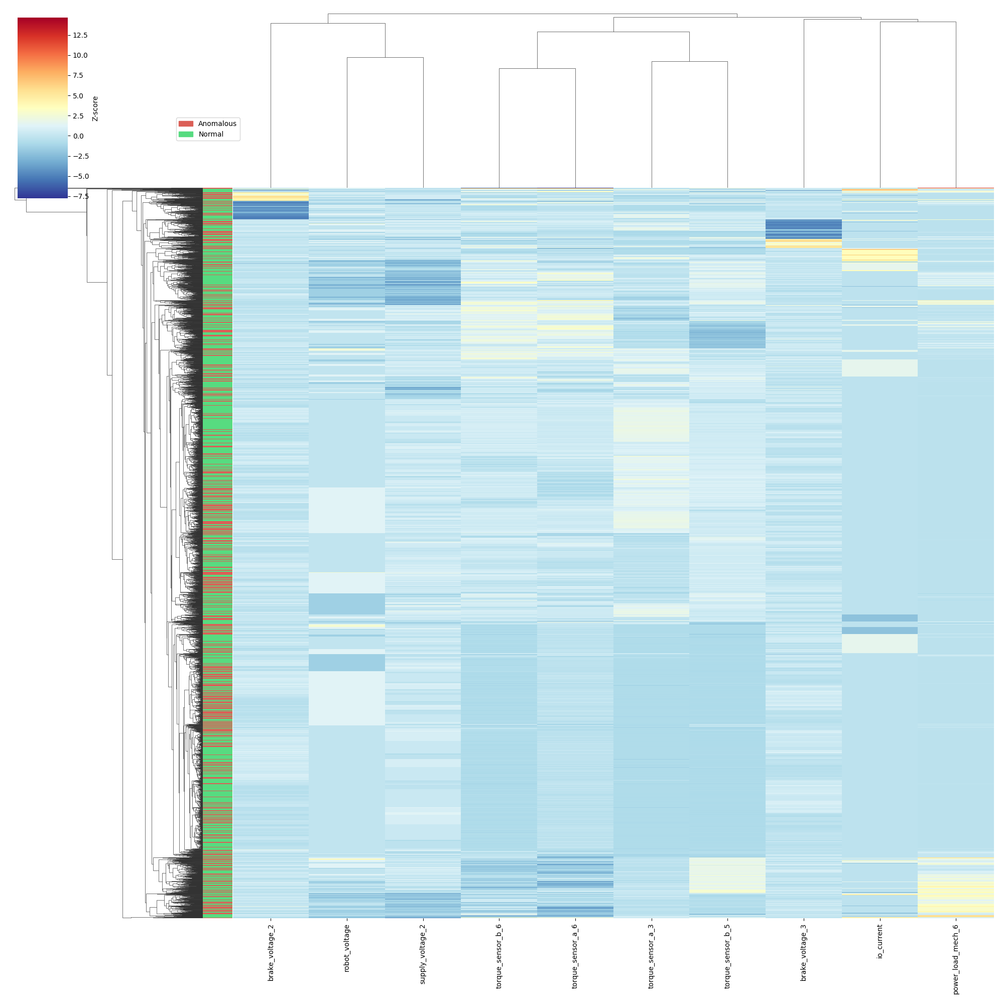

In [37]:
# Create a color dictionary for your categories
colors = sns.color_palette("hls", 8)
red = colors[0]
green = colors[3]
color_dict = {1: red, 0: green}


# Create a list of colors for each row
row_colors = subset['anomaly'].map(color_dict).values

# plot the re-ordered cluster map
cbar_kws={'orientation': 'vertical',
        'label': 'Z-score',
        'extendrect':True,
        'shrink': .5,
        }

# Create the clustermap
cluster=sns.clustermap(subset.drop('anomaly', axis=1),
                       row_colors=row_colors,
                       z_score=1,
                       cmap='RdYlBu_r',
                       col_cluster=True,
                       yticklabels=False,
                       cbar_kws=cbar_kws,
                      #  method='centroid',
                       figsize=(20,20),
                       )

plt.setp(cluster.ax_heatmap.get_xticklabels(), 
        rotation=90
        )

legend_labels = [mpatches.Patch(color=red, label='Anomalous'),
                mpatches.Patch(color=green, label='Normal')]
    
plt.legend(handles=legend_labels, 
           title='', 
           loc='lower right', 
           bbox_to_anchor=(4.5, 0.3),
           **{'ncol': 1})

# cb_ax = cluster.ax_cbar.yaxis.set_label_position('left')
plt.xlabel('Target', visible=False)

# Show the plot
if os.path.exists('figures/clustermap/'):
    pass
else:
    os.makedirs('figures/clustermap/')

plt.savefig('figures/clustermap/clustermap_10_predictors.png', dpi=1200, bbox_inches='tight')

plt.show()

In [36]:
# print(cluster.dendrogram_row.reordered_ind)
print(cluster.dendrogram_col.reordered_ind)

[6, 0, 1, 3, 5, 2, 9, 7, 4, 8]


In [58]:
labels = cluster.ax_heatmap.xaxis.get_majorticklabels()
labels

[Text(0.5, 0, 'brake_voltage_2'),
 Text(1.5, 0, 'robot_voltage'),
 Text(2.5, 0, 'supply_voltage_2'),
 Text(3.5, 0, 'torque_sensor_b_6'),
 Text(4.5, 0, 'torque_sensor_a_6'),
 Text(5.5, 0, 'torque_sensor_a_3'),
 Text(6.5, 0, 'torque_sensor_b_5'),
 Text(7.5, 0, 'brake_voltage_3'),
 Text(8.5, 0, 'io_current'),
 Text(9.5, 0, 'power_load_mech_6')]

In [60]:
cluster.dendrogram_col.linkage # linkage matrix for columns
cluster.dendrogram_row.linkage # linkage matrix for rows

array([[3.69500000e+03, 4.10300000e+03, 1.26981123e-02, 2.00000000e+00],
       [1.09600000e+03, 4.31600000e+03, 2.23386205e-02, 2.00000000e+00],
       [8.98000000e+02, 4.07100000e+03, 2.52637678e-02, 2.00000000e+00],
       ...,
       [9.99300000e+03, 9.99500000e+03, 1.11644259e+01, 4.99700000e+03],
       [9.78700000e+03, 9.99600000e+03, 1.69817187e+01, 4.99900000e+03],
       [6.49000000e+02, 9.99700000e+03, 1.80893686e+01, 5.00000000e+03]])

In [41]:
clustered_table = extract_clustered_table(cluster, subset)
clustered_table

,brake_voltage_2,robot_voltage,supply_voltage_2,torque_sensor_b_6,torque_sensor_a_6,torque_sensor_a_3,torque_sensor_b_5,brake_voltage_3,io_current,power_load_mech_6
139513,10.895591,48.582687,47.401848,0.596175,0.735066,-32.446255,-0.985762,10.875487,0.087890,1.168115
141369,10.754873,48.582687,47.482258,-0.778337,-0.710193,-30.518864,0.777773,11.177029,0.087890,1.004877
135831,10.694568,48.603485,47.442055,-0.772817,-0.605183,-34.329845,0.900606,11.076515,0.087890,1.159219
144989,10.895594,48.541092,47.281235,0.278768,0.417275,-30.989761,0.225023,11.036308,0.087890,0.543742
136148,10.915693,48.582687,47.401848,0.678977,0.613476,-32.917152,0.567202,11.096617,0.087890,0.290227
...,...,...,...,...,...,...,...,...,...,...
1020882,10.594055,48.520294,47.281235,0.005521,0.331609,-29.018562,0.573051,10.855387,0.131835,0.118447
2147081,10.674464,48.541092,47.341541,-0.019319,0.198966,-32.314842,0.698809,10.835283,0.117187,0.131198
266693,10.573953,48.541092,47.281235,-0.085561,0.276341,-31.241634,0.631543,10.875488,0.117187,0.056992
102938,9.709540,48.541092,47.321438,0.182165,0.154752,-26.762636,0.374178,10.895593,0.102538,0.223730


In [42]:
clustered_table.to_csv('figures/clustermap/clustered_table_10_predictors.csv')